In [1]:
import numpy as np
from numpy import linalg as LA
from scipy.interpolate import interp1d

In [2]:
import matplotlib.pyplot  as plt
import plotly.graph_objects as go
from time import time

In [3]:
def Init_stringA(A,B,N=20):
    
    temp=np.array([A,B])
    d1=temp[:,0]
    d2=temp[:,1]
    alpha=np.array([0,1])
    d1_re=Init_interpolation(alpha,d1,N).reshape(-1,1)
    d2_re=Init_interpolation(alpha,d2,N).reshape(-1,1)

    return np.concatenate([d1_re,d2_re],axis=1)
def Init_interpolation(x,y,N=20):
    f=interp1d(x, y, kind='linear')
    return f(np.array(range(N+1))/N)

In [4]:
B=np.array([-2.87,0.86])
A=np.array([-0,.00])
# B=np.array([1,.00])

In [5]:
Init=Init_stringA(A,B,40)

In [6]:
AA=np.append(Init[:10,:],Init[-10:,:]).reshape(20,2)

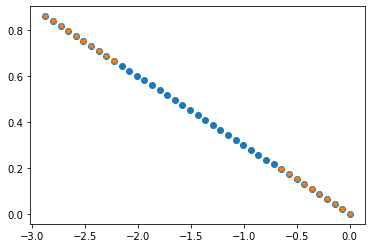

In [7]:
plt.plot(Init[:,0],Init[:,1],'o')
plt.plot(AA[:,0],AA[:,1],'*')


In [8]:
def V(x):
    #V(x,y)=(x^2-1)^2+y^2
    Y=x[-1]
    X=x[0]
    return 1+np.sin(X)*np.sin(X)+np.sin(Y)*np.sin(Y)-np.exp(-(X*X+Y*Y))
#     return (X*X-1)*(X*X-1)+Y*Y

def gradient_V(x):
    '''gradient of V'''
    y=x[-1]
    x=x[0]
#     d1=4*X*X*X-4*X
#     d2=2*Y
    d1=2*np.sin(x)*np.cos(x)+2*x*np.exp(-(x*x+y*y))
    d2=2*np.sin(y)*np.cos(y)+2*y*np.exp(-(x*x+y*y))
    return np.array([d1,d2])

In [9]:
xinit=Init[:,0]
yinit=Init[:,1]
zinit=list(map(V,Init))

In [4]:
def V(x):
    #V(x,y)=(1-x^2-y^2)^2+y^2/(x^2+y^2)
    Y=x[-1]
    X=x[0]
    return (1-X*X-Y*Y)*(1-X*X-Y*Y)+Y*Y/(X*X+Y*Y)
def gradient_V(x):
    '''gradient of V'''
    Y=x[-1]
    X=x[0]
    d1=-4*X*(1-X*X-Y*Y)-Y*Y*2*X/((X*X+Y*Y)*(X*X+Y*Y))
    d2=-4*Y*(1-X*X-Y*Y)+Y*2*X*X/((X*X+Y*Y)*(X*X+Y*Y))
    return np.array([d1,d2])

In [11]:
# def V(x):
#     #V(x,y)=(x^2-1)^2+y^2
#     Y=x[-1]
#     X=x[0]
#     return 1+np.sin(X)*np.sin(X)+np.sin(Y)*np.sin(Y)-np.exp(-(X*X+Y*Y))
# #     return (X*X-1)*(X*X-1)+Y*Y

# def gradient_V(x):
#     '''gradient of V'''
#     y=x[-1]
#     x=x[0]
# #     d1=4*X*X*X-4*X
# #     d2=2*Y
#     d1=2*np.sin(x)*np.cos(x)+2*x*np.exp(-(x*x+y*y))
#     d2=2*np.sin(y)*np.cos(y)+2*y*np.exp(-(x*x+y*y))
#     return np.array([d1,d2])

In [12]:
[X,Y]=np.meshgrid(np.linspace(-4,4,200),np.linspace(-4,4,200))
Z=1+np.sin(X)*np.sin(X)+np.sin(Y)*np.sin(Y)-np.exp(-(X*X+Y*Y));




In [5]:
[X,Y]=np.meshgrid(np.linspace(-4,4,200),np.linspace(-4,4,200))
Z=1+np.sin(0.8*X)*np.sin(0.8*X)+np.sin(Y)*np.sin(Y)-np.exp(-(X*X+Y*Y));

# [X,Y]=np.meshgrid(np.linspace(-1.3,1.3,200),np.linspace(-1.3,1.3,200))
# Z=(X*X-1)*(X*X-1)+Y*Y
[X,Y]=np.meshgrid(np.linspace(-1.3,1.3,200),np.linspace(-0.3,1.3,200))
Z=(1-X*X-Y*Y)*(1-X*X-Y*Y)+Y*Y/(X*X+Y*Y)
%matplotlib inline
    
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y)]) # z is 2D,x,y could be 1d 2d
fig.update_layout(title='V', autosize=False,
                      width=500, height=500,
                      margin=dict(l=65, r=50, b=65, t=90))

# fig.add_scatter3d(
#         x=xinit,
#         y=yinit,
#         z=zinit,
#         name='Initial',
#         mode='markers',
#         marker=dict(
#             size=2,                # set color to an array/list of desired values
#             colorscale='Blackbody',   # choose a colorscale
#             opacity=0.8
#         ))
fig.show()

In [6]:
def rungeKutta(phi,dt,f):
    '''
    solve autonomous ODE phi_t=f(phi),eq(6) in the paper with forth order
    phi: ith image of string, to update from nth iteration to (n+1)th iteration
    dt: time step
    f: a function
    '''
    k1=dt*f(phi)
    k2=dt*f(phi+1/2*k1)
    k3=dt*f(phi+1/2*k2)
    k4=dt*f(phi+k3)
    rg=-(k1/6+k2/3+k3/3+k4/6)#f=gradient V, there should minus
    return rg

def euler(phi,dt,gradient):
    '''
    explicit euler, gradient is \Delta V(phi)
    '''
    return -dt*gradient

In [7]:
def Repara(Phi,N=20):
    '''Phi is the string discretized by N images, each image is M-dimension'''
    length=len(Phi)
    #alpha^star
    s=[]
    s.append(0)#s_0=0
    for i in range(length-1):
        s.append(s[i]+LA.norm(Phi[i+1,:]-Phi[i,:]))
#         s.append(s[i]+np.exp(0.5*V(Phi[i+1,:])+0.5*V(Phi[i,:]))*LA.norm(Phi[i+1,:]-Phi[i,:]))
    alpha=np.array(s)/s[-1]
    #cubic spline interpolation for every dimension eg: (alpha,phi_1) and (alpha,phi_2)(if phi is two dimensional
    d_list=[]
    for i in range(Phi.shape[-1]):
        d=Phi[:,i]
        d_list.append(spline_repara(alpha,d,N).reshape(-1,1))#cubic spline interpolatation on every dimension

    return np.concatenate(d_list,axis=1)


In [8]:
def spline_repara(x,y,N=20):
    '''spline interpolation 1d
    divede into N images'''
    
    # from scipy.interpolate import splev, splrep
    # spl = splrep(x, y)
    # return splev(np.array(range(N+1))/N, spl)

    from scipy.interpolate import interp1d
    length=len(x)
#     if length<2:
#         print('Phi is empty or only has one point')
#     if length>3:#at least four points to cubic interpolation
#         f=interp1d(x, y, kind='cubic')
#     if length==3:#three points, quadratic interpolation
#         print('quadratic interpolation')
#         f=interp1d(x, y, kind='quadratic')
#     if length==2:#two points, linear interpolation
#         print('linear interpolation')
#         f=interp1d(x, y, kind='linear')
    f=interp1d(x, y, kind='cubic')
    return f(np.array(range(N+1))/N)

In [9]:
BB=Repara(AA,N=20)#reparameterization

NameError: name 'AA' is not defined

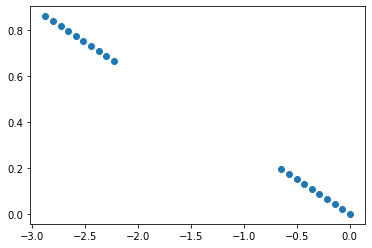

In [69]:
plt.plot(AA[:,0],AA[:,1],'o')
plt.plot(BB[:,0],BB[:,1],'*')

In [22]:
#init string need not be local minima
a=np.array([-.51,0.5])
b=np.array([0.5,.51])

# a=np.array([np.pi,np.pi])
# b=np.array([0.02,.01])


In [10]:
a=np.array([-.51,0])
b=np.array([0.5,0])

In [23]:
N=20
TOL=max(pow(N,-4),pow(10,-10))
dt=0.05*min(0.2,1/N)

In [24]:
TOL,dt

(6.25e-06, 0.0025000000000000005)

In [25]:
Init_string=Init_stringA(a,b,N)

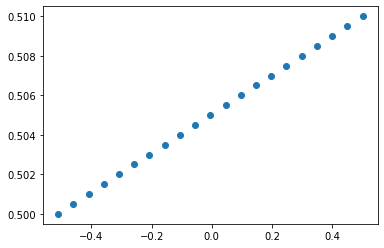

In [26]:
plt.plot(Init_string[:,0],Init_string[:,1],'o')

In [37]:
N

20

In [15]:
def Proj_gradient_V(phi,tao):
    gradient=gradient_V(phi)
    return gradient-np.matmul(tao,gradient)*tao


In [16]:
def String_Error(Phi,Phi_new):
    return [LA.norm(each)/dt for each in Phi-Phi_new]

In [27]:
MAXITER=7500#max iteration steps
steps=1
Phi=Init_stringA(a,b,N)
iter_error=[0]*(N+1)
start=time()
while 1:
    print('Iteration %d'%steps)
    Phi_new=np.zeros_like(Phi)#reset Phi_new
    #update string 
    for i in [0,N]:#the start and end of string, updated by step descent
        rg=rungeKutta(Phi[i,:],dt,gradient_V)
        Phi_new[i,:]=Phi[i,:]+rg#iteration scheme
    
    for i in range(1,N):#the inner part of string,updated by projection step descent 
        difference=Phi[i]-Phi[i-1]
        tao=difference/LA.norm(difference)
        rg=rungeKutta(Phi[i],dt,lambda x:Proj_gradient_V(x,tao))
        Phi_new[i,:]=Phi[i,:]+rg#iteration scheme
    
    #reparameterization
    Phi=Repara(Phi_new,N)#update Phi
    steps+=1
    iter_error=String_Error(Phi,Phi_new)
    print(max(iter_error))
    print('\n')
    if max(iter_error)<TOL:#if d<TOL stop iteration
        print('converges after %d steps'%steps)
        break
    if steps>MAXITER:
        print('does not converge until %d iteration'%MAXITER)
        break
time_cost=time()-start

Iteration 1
1.7857824385774161


Iteration 2
1.775243778715207


Iteration 3
1.76475406342567


Iteration 4
1.7541420970327872


Iteration 5
1.7434125861177263


Iteration 6
1.7325702025570755


Iteration 7
1.7216195763719362


Iteration 8
1.7105652858983103


Iteration 9
1.699411844433034


Iteration 10
1.6881636822716644


Iteration 11
1.6768251227529434


Iteration 12
1.6654003505329182


Iteration 13
1.653893369824544


Iteration 14
1.6423079497273734


Iteration 15
1.6306475530093425


Iteration 16
1.6189152437732324


Iteration 17
1.60711356829207


Iteration 18
1.5952444019475953


Iteration 19
1.583308753571592


Iteration 20
1.5713065166546123


Iteration 21
1.5592361548067875


Iteration 22
1.5470943066725413


Iteration 23
1.5348752934092393


Iteration 24
1.5231252544177056


Iteration 25
1.511850035666493


Iteration 26
1.5008331277564464


Iteration 27
1.4901602476702795


Iteration 28
1.479939771985681


Iteration 29
1.470308445463905


Iteration 30
1.46143832770646


It

3.7376524545180394


Iteration 305
4.184972444194949


Iteration 306
4.6580114978259495


Iteration 307
5.150951288697224


Iteration 308
5.652778282100474


Iteration 309
6.14580873367702


Iteration 310
6.604875580228335


Iteration 311
6.997753081218527


Iteration 312
7.28729837750421


Iteration 313
7.4356477042010845


Iteration 314
7.410765807754985


Iteration 315
7.195289999561512


Iteration 316
6.795739431313859


Iteration 317
6.246933790928937


Iteration 318
5.605992883071282


Iteration 319
4.936403347234554


Iteration 320
4.2907744128403635


Iteration 321
3.701547482290637


Iteration 322
3.643630238382057


Iteration 323
3.63846951068843


Iteration 324
3.6445282562550454


Iteration 325
3.6707112008127756


Iteration 326
3.7244299306388347


Iteration 327
3.812363583596186


Iteration 328
3.941152950735067


Iteration 329
4.118249381651802


Iteration 330
4.353242104991881


Iteration 331
4.660154421162772


Iteration 332
5.061571195247121


Iteration 333
5.59631095

0.7345354249535553


Iteration 558
0.715514788629865


Iteration 559
0.696686522376576


Iteration 560
0.6780087472791194


Iteration 561
0.6594315011691365


Iteration 562
0.6408952142210042


Iteration 563
0.6223288604884224


Iteration 564
0.6036477233737686


Iteration 565
0.5847507039380322


Iteration 566
0.565517092259379


Iteration 567
0.5458027149748544


Iteration 568
0.5254353687866464


Iteration 569
0.5042094533938074


Iteration 570
0.48187973312130433


Iteration 571
0.4581541921380562


Iteration 572
0.4326860148045141


Iteration 573
0.4050648363351419


Iteration 574
0.37480759158409443


Iteration 575
0.3413495703548476


Iteration 576
0.3134578659965229


Iteration 577
0.3669209576469162


Iteration 578
0.43068513906822803


Iteration 579
0.5065739453395249


Iteration 580
0.5966387537701741


Iteration 581
0.7031358069413207


Iteration 582
0.828470898781406


Iteration 583
0.9750978115840679


Iteration 584
1.1453541708977153


Iteration 585
1.3412193021291505




1.3424431476204897


Iteration 846
1.3284436407836617


Iteration 847
1.323381436454384


Iteration 848
1.3081609229529128


Iteration 849
1.2748671830130447


Iteration 850
1.2216658557664979


Iteration 851
1.147296308776244


Iteration 852
1.0512131949985315


Iteration 853
0.9336453827203846


Iteration 854
0.7955467174295492


Iteration 855
0.6384354072910405


Iteration 856
0.537618618844235


Iteration 857
0.5944521379225259


Iteration 858
0.7228537691063764


Iteration 859
0.850909632719483


Iteration 860
1.0553226716595225


Iteration 861
1.3477045087221449


Iteration 862
1.6536938803356054


Iteration 863
1.976885640386609


Iteration 864
2.322401799479699


Iteration 865
2.6974481882246155


Iteration 866
3.112559579186864


Iteration 867
3.5839530488898803


Iteration 868
4.137387029463835


Iteration 869
4.81348954240076


Iteration 870
5.673255620888562


Iteration 871
6.800106939064429


Iteration 872
8.292041045375022


Iteration 873
10.234727779416648


Iteration 87

1.2950419567437663


Iteration 1128
1.2514962658492232


Iteration 1129
1.2089962332906081


Iteration 1130
1.1675834059869337


Iteration 1131
1.1272906035289028


Iteration 1132
1.0881421999962406


Iteration 1133
1.1030136851149979


Iteration 1134
1.1176377532743993


Iteration 1135
1.1318463829341088


Iteration 1136
1.1456026554906957


Iteration 1137
1.158869977172847


Iteration 1138
1.1716122816005874


Iteration 1139
1.1837942708643452


Iteration 1140
1.1953816919843059


Iteration 1141
1.2063416441258323


Iteration 1142
1.216642912957493


Iteration 1143
1.226256319461331


Iteration 1144
1.2351550738173744


Iteration 1145
1.2433151234574413


Iteration 1146
1.250715483501964


Iteration 1147
1.257338537791116


Iteration 1148
1.2631702992017082


Iteration 1149
1.2682006190039634


Iteration 1150
1.2724233365339892


Iteration 1151
1.2758363624895184


Iteration 1152
1.2784416915333512


Iteration 1153
1.2802453425917737


Iteration 1154
1.2812572281170125


Iteration 11

1.8345013903764202


Iteration 1422
1.812888260549397


Iteration 1423
1.7807785834825582


Iteration 1424
1.7365791501704875


Iteration 1425
1.6784678750533009


Iteration 1426
1.6362783171108537


Iteration 1427
1.7452535694755384


Iteration 1428
1.8748792540878696


Iteration 1429
2.0148656184882308


Iteration 1430
2.169166213222505


Iteration 1431
2.343595978095209


Iteration 1432
2.546558582968358


Iteration 1433
2.7902092361785766


Iteration 1434
3.092329077336956


Iteration 1435
3.47934256380803


Iteration 1436
3.9911063913815825


Iteration 1437
4.688247286559575


Iteration 1438
5.6625369195196535


Iteration 1439
7.048619201242547


Iteration 1440
9.026985420023165


Iteration 1441
11.781950301528227


Iteration 1442
15.321661053317825


Iteration 1443
19.06439266805692


Iteration 1444
21.55503674281103


Iteration 1445
21.110585947012318


Iteration 1446
16.718227430288316


Iteration 1447
10.11289560145741


Iteration 1448
4.987003476375884


Iteration 1449
2.2797

0.3351268390517565


Iteration 1684
0.31561854079747703


Iteration 1685
0.2953532103116277


Iteration 1686
0.2747666436459656


Iteration 1687
0.2544185099350946


Iteration 1688
0.2349797095319829


Iteration 1689
0.2171963110033243


Iteration 1690
0.20181284127137114


Iteration 1691
0.1894426125537051


Iteration 1692
0.18039986071690453


Iteration 1693
0.17455608893905805


Iteration 1694
0.17130882691484478


Iteration 1695
0.16970299850329665


Iteration 1696
0.1686512283922099


Iteration 1697
0.16715488890646402


Iteration 1698
0.164462009120139


Iteration 1699
0.16015267296633676


Iteration 1700
0.15416876568967988


Iteration 1701
0.14680286192501973


Iteration 1702
0.13864709583266818


Iteration 1703
0.13048771958213332


Iteration 1704
0.12312465538705897


Iteration 1705
0.1171179692596565


Iteration 1706
0.11253078854597286


Iteration 1707
0.10880415437903054


Iteration 1708
0.10712028340023486


Iteration 1709
0.10215291177973056


Iteration 1710
0.0953829170

1.0829066830840846


Iteration 1930
1.0924179938438


Iteration 1931
1.103793714561709


Iteration 1932
1.1173359966058392


Iteration 1933
1.1333832355334181


Iteration 1934
1.1523138025127089


Iteration 1935
1.174549696462359


Iteration 1936
1.2005597644202834


Iteration 1937
1.230861923358913


Iteration 1938
1.266023503585216


Iteration 1939
1.3066583865081354


Iteration 1940
1.3534189871624065


Iteration 1941
1.4069802953575041


Iteration 1942
1.468012118277963


Iteration 1943
1.537134394655269


Iteration 1944
1.6148491258556692


Iteration 1945
1.7014414629511077


Iteration 1946
1.7968425421621952


Iteration 1947
1.9004490564257526


Iteration 1948
2.010901208428034


Iteration 1949
2.125833962974964


Iteration 1950
2.241638279571435


Iteration 1951
2.3532985624866463


Iteration 1952
2.4544032696319356


Iteration 1953
2.5374415339195577


Iteration 1954
2.5944750979617006


Iteration 1955
2.618188729764213


Iteration 1956
2.603174419297587


Iteration 1957
2.5471

0.3960926529239342


Iteration 2218
0.3946602728899701


Iteration 2219
0.39348116763980145


Iteration 2220
0.3925414358794339


Iteration 2221
0.3918276647741505


Iteration 2222
0.3913270219374288


Iteration 2223
0.3910273225553174


Iteration 2224
0.39091707614086396


Iteration 2225
0.3909855167489774


Iteration 2226
0.39122261983081524


Iteration 2227
0.3916191083906528


Iteration 2228
0.3921664506186437


Iteration 2229
0.39285685078092775


Iteration 2230
0.3936832348713778


Iteration 2231
0.3946392321945619


Iteration 2232
0.3957191514250268


Iteration 2233
0.3969178504393259


Iteration 2234
0.3982307871220262


Iteration 2235
0.3996541275318931


Iteration 2236
0.40118465346097104


Iteration 2237
0.40281972986461173


Iteration 2238
0.40455727127646823


Iteration 2239
0.4063957159888493


Iteration 2240
0.40833400370715406


Iteration 2241
0.41037155690432997


Iteration 2242
0.41250826550406045


Iteration 2243
0.4147444748530136


Iteration 2244
0.4170809769847874

0.2063770349691829


Iteration 2494
0.20706114317451352


Iteration 2495
0.20769325838490538


Iteration 2496
0.20827495954778547


Iteration 2497
0.20880775026322992


Iteration 2498
0.20929306504473408


Iteration 2499
0.20973227395757074


Iteration 2500
0.21012668639606738


Iteration 2501
0.21047755437980828


Iteration 2502
0.2107860755482233


Iteration 2503
0.21105339594720274


Iteration 2504
0.21128061264989387


Iteration 2505
0.21146877623725063


Iteration 2506
0.21161889315488525


Iteration 2507
0.21173192795191995


Iteration 2508
0.2118088054112721


Iteration 2509
0.21185041257432


Iteration 2510
0.2118576006683549


Iteration 2511
0.21183118693686132


Iteration 2512
0.21177195638034568


Iteration 2513
0.21168066341077718


Iteration 2514
0.21155803342120055


Iteration 2515
0.21140476427743538


Iteration 2516
0.21122152773497535


Iteration 2517
0.21100897078081982


Iteration 2518
0.2107677169097297


Iteration 2519
0.21049836733043273


Iteration 2520
0.2102015

0.07216720388463184


Iteration 2724
0.07278082756055022


Iteration 2725
0.07369828381322138


Iteration 2726
0.07460542509752402


Iteration 2727
0.07550192485609086


Iteration 2728
0.0765145188708034


Iteration 2729
0.07773086441498132


Iteration 2730
0.07892860817423869


Iteration 2731
0.08010744156350338


Iteration 2732
0.08126706240657615


Iteration 2733
0.082407175234092


Iteration 2734
0.08352749157093318


Iteration 2735
0.0846277302158637


Iteration 2736
0.08570761751146068


Iteration 2737
0.08676688760419012


Iteration 2738
0.08780528269693975


Iteration 2739
0.08882255328917597


Iteration 2740
0.08981845840793974


Iteration 2741
0.09079276582983363


Iteration 2742
0.09174525229085202


Iteration 2743
0.09267570368656322


Iteration 2744
0.09358391526181042


Iteration 2745
0.09446969179038946


Iteration 2746
0.09533284774344586


Iteration 2747
0.09617320744636346


Iteration 2748
0.09699060522832462


Iteration 2749
0.09778488555704234


Iteration 2750
0.098

0.027544853142548453


Iteration 2961
0.02726314212892056


Iteration 2962
0.02698452173356556


Iteration 2963
0.02670896895875396


Iteration 2964
0.026436460612802148


Iteration 2965
0.026166973325386325


Iteration 2966
0.025900483561441687


Iteration 2967
0.025636967634400962


Iteration 2968
0.02537640172069548


Iteration 2969
0.025118761873229447


Iteration 2970
0.02486402403204795


Iteration 2971
0.024612164038968706


Iteration 2972
0.024363157647783063


Iteration 2973
0.02411698053805184


Iteration 2974
0.02387360832263513


Iteration 2975
0.023633016563652767


Iteration 2976
0.023395180777254502


Iteration 2977
0.023160076448488227


Iteration 2978
0.022927679038358406


Iteration 2979
0.022697963995755046


Iteration 2980
0.0224709067627008


Iteration 2981
0.022246482788359025


Iteration 2982
0.02202466753195717


Iteration 2983
0.02180543647598425


Iteration 2984
0.02158876513129096


Iteration 2985
0.021374629044939978


Iteration 2986
0.021163003809313772


I

0.005352478369958952


Iteration 3194
0.005334496563334645


Iteration 3195
0.005316682234395644


Iteration 3196
0.005299032833526439


Iteration 3197
0.005281545844598631


Iteration 3198
0.005264218783481126


Iteration 3199
0.005247049198495023


Iteration 3200
0.0052300346703925095


Iteration 3201
0.0052131728103146915


Iteration 3202
0.005196461262150869


Iteration 3203
0.005179897698378498


Iteration 3204
0.005163479824189198


Iteration 3205
0.005147205373005453


Iteration 3206
0.0051310721093432085


Iteration 3207
0.005115077825669633


Iteration 3208
0.005099220344858838


Iteration 3209
0.005083497517038441


Iteration 3210
0.005067907222382744


Iteration 3211
0.005052447366732314


Iteration 3212
0.005037115885960771


Iteration 3213
0.005021910741861545


Iteration 3214
0.005006829923293265


Iteration 3215
0.004991871446558088


Iteration 3216
0.004977033353768635


Iteration 3217
0.004962313712847606


Iteration 3218
0.004947710618459843


Iteration 3219
0.0049332

0.0028506026062484046


Iteration 3432
0.0028421110103455088


Iteration 3433
0.002833623866012333


Iteration 3434
0.0028251412292824847


Iteration 3435
0.002816663157195171


Iteration 3436
0.0028081897081866213


Iteration 3437
0.0027997209410285857


Iteration 3438
0.0027912569169797736


Iteration 3439
0.0027827976966558633


Iteration 3440
0.0027743433434078346


Iteration 3441
0.0027658939203098077


Iteration 3442
0.0027574494919065176


Iteration 3443
0.0027490101240250494


Iteration 3444
0.002740575882612993


Iteration 3445
0.0027321468353624792


Iteration 3446
0.0027237230500731444


Iteration 3447
0.002715304596553173


Iteration 3448
0.0027068915438365174


Iteration 3449
0.002698483962981067


Iteration 3450
0.0026900819255844567


Iteration 3451
0.002681685503174465


Iteration 3452
0.0026732947699201963


Iteration 3453
0.0026649097983632688


Iteration 3454
0.0026565306632772515


Iteration 3455
0.0026481574393016176


Iteration 3456
0.0026397902029578956


Iterati

0.0008882871674164908


Iteration 3715
0.0008835845983186852


Iteration 3716
0.0008788992081541168


Iteration 3717
0.0008742309788040392


Iteration 3718
0.0008695798927318601


Iteration 3719
0.0008649459314048897


Iteration 3720
0.0008603290766662465


Iteration 3721
0.000855729309093265


Iteration 3722
0.0008511466104673693


Iteration 3723
0.000846580960316595


Iteration 3724
0.0008420323395960255


Iteration 3725
0.0008375007275085928


Iteration 3726
0.0008329861041692737


Iteration 3727
0.0008284884485730995


Iteration 3728
0.000824007739670579


Iteration 3729
0.0008195439560461763


Iteration 3730
0.0008150970760222924


Iteration 3731
0.0008106670782714657


Iteration 3732
0.000807376248664435


Iteration 3733
0.0008043079709247901


Iteration 3734
0.0008012474510522085


Iteration 3735
0.0007981946976544279


Iteration 3736
0.0007951497183633737


Iteration 3737
0.0007921125220241877


Iteration 3738
0.0007890831157804204


Iteration 3739
0.0007860615071274649


Itera

0.0003948994560141089


Iteration 3950
0.0003938276090908869


Iteration 3951
0.0003927582486653057


Iteration 3952
0.00039169136992629354


Iteration 3953
0.0003906269681298607


Iteration 3954
0.0003895650378782457


Iteration 3955
0.0003885055744084168


Iteration 3956
0.00038744857248430945


Iteration 3957
0.0003863940269909987


Iteration 3958
0.00038534193400059153


Iteration 3959
0.0003842922872037515


Iteration 3960
0.0003832450827034961


Iteration 3961
0.00038220031437717015


Iteration 3962
0.0003811579787183524


Iteration 3963
0.0003801180696257468


Iteration 3964
0.0003790805827735629


Iteration 3965
0.0003780455130435708


Iteration 3966
0.00037701285558112074


Iteration 3967
0.0003759826051719219


Iteration 3968
0.0003749547575327191


Iteration 3969
0.0003739293073781893


Iteration 3970
0.00037290624951148385


Iteration 3971
0.0003718855800207992


Iteration 3972
0.00037086729273609907


Iteration 3973
0.00036985138401496754


Iteration 3974
0.000368837848456

0.00021164106530551597


Iteration 4169
0.00021100864547494798


Iteration 4170
0.00021037781608316633


Iteration 4171
0.0002097485746125947


Iteration 4172
0.00020912091760494228


Iteration 4173
0.0002084948419910453


Iteration 4174
0.00020787034453496956


Iteration 4175
0.0002072474217612427


Iteration 4176
0.00020662607132755937


Iteration 4177
0.00020600628873678704


Iteration 4178
0.00020538807227304533


Iteration 4179
0.00020477141772008096


Iteration 4180
0.0002041563226488248


Iteration 4181
0.00020354278314115162


Iteration 4182
0.0002029307966337671


Iteration 4183
0.00020232036027994916


Iteration 4184
0.00020171147002633766


Iteration 4185
0.00020110412379047095


Iteration 4186
0.00020049831762337144


Iteration 4187
0.00019989404883500537


Iteration 4188
0.00019929131416361075


Iteration 4189
0.00019869011056745963


Iteration 4190
0.00019809043527440346


Iteration 4191
0.00019749228447848695


Iteration 4192
0.00019689565606381267


Iteration 4193
0.000

0.000104309252733866


Iteration 4399
0.00010403379898239585


Iteration 4400
0.00010375862751027244


Iteration 4401
0.00010348374144353648


Iteration 4402
0.00010320914383036778


Iteration 4403
0.00010293483771145961


Iteration 4404
0.00010266082566820163


Iteration 4405
0.00010238711112370443


Iteration 4406
0.00010211369638383963


Iteration 4407
0.00010184058483628551


Iteration 4408
0.00010156777883629178


Iteration 4409
0.00010129528172615503


Iteration 4410
0.00010102309618667123


Iteration 4411
0.00010075122412925946


Iteration 4412
0.00010047966931218553


Iteration 4413
0.00010020843401075678


Iteration 4414
9.993752061681877e-05


Iteration 4415
9.966693214662001e-05


Iteration 4416
9.939667138941513e-05


Iteration 4417
9.912674013581314e-05


Iteration 4418
9.88571414575486e-05


Iteration 4419
9.858787782342065e-05


Iteration 4420
9.83189517709263e-05


Iteration 4421
9.80503659344421e-05


Iteration 4422
9.778212256960202e-05


Iteration 4423
9.751422329578

4.9431850264342815e-05


Iteration 4643
4.926422230332326e-05


Iteration 4644
4.9097054450041204e-05


Iteration 4645
4.8930345864171024e-05


Iteration 4646
4.876409637220093e-05


Iteration 4647
4.8598305402071116e-05


Iteration 4648
4.8432971948096754e-05


Iteration 4649
4.826809570719016e-05


Iteration 4650
4.8103676365275714e-05


Iteration 4651
4.7939712641337776e-05


Iteration 4652
4.777620446131069e-05


Iteration 4653
4.761315130353725e-05


Iteration 4654
4.7450551925128675e-05


Iteration 4655
4.7288406202381666e-05


Iteration 4656
4.712671379051006e-05


Iteration 4657
4.6965473367456996e-05


Iteration 4658
4.680468486208327e-05


Iteration 4659
4.6644347236826026e-05


Iteration 4660
4.6484460147566464e-05


Iteration 4661
4.632502247295634e-05


Iteration 4662
4.616603471427196e-05


Iteration 4663
4.600749480004371e-05


Iteration 4664
4.5849403111883034e-05


Iteration 4665
4.569175857875069e-05


Iteration 4666
4.553456044876763e-05


Iteration 4667
4.5377808108

2.3408146097815307e-05


Iteration 4851
2.332017497874556e-05


Iteration 4852
2.3232501372786238e-05


Iteration 4853
2.3145124804119814e-05


Iteration 4854
2.3058044184766785e-05


Iteration 4855
2.2971259088975308e-05


Iteration 4856
2.2884768659750338e-05


Iteration 4857
2.2798571876274245e-05


Iteration 4858
2.2712667586256023e-05


Iteration 4859
2.2627055984447433e-05


Iteration 4860
2.2541735483254455e-05


Iteration 4861
2.2456705468877143e-05


Iteration 4862
2.2371965352549112e-05


Iteration 4863
2.2287513948810443e-05


Iteration 4864
2.2203350824182836e-05


Iteration 4865
2.2119474975542685e-05


Iteration 4866
2.203588557378334e-05


Iteration 4867
2.1952582069414602e-05


Iteration 4868
2.1869563413537406e-05


Iteration 4869
2.178682868769443e-05


Iteration 4870
2.1704377676768973e-05


Iteration 4871
2.1622209432393852e-05


Iteration 4872
2.154032239077788e-05


Iteration 4873
2.145871651101798e-05


Iteration 4874
2.137739128127613e-05


Iteration 4875
2.1296

9.963490436043335e-06


Iteration 5070
9.923522180269671e-06


Iteration 5071
9.883705326972822e-06


Iteration 5072
9.844038547849565e-06


Iteration 5073
9.804521842945063e-06


Iteration 5074
9.765154907647228e-06


Iteration 5075
9.725936375932878e-06


Iteration 5076
9.686866417406514e-06


Iteration 5077
9.647944334966389e-06


Iteration 5078
9.609169974702411e-06


Iteration 5079
9.570542206139561e-06


Iteration 5080
9.532060850350906e-06


Iteration 5081
9.493725266683897e-06


Iteration 5082
9.45553537820541e-06


Iteration 5083
9.417490093738712e-06


Iteration 5084
9.379589301756296e-06


Iteration 5085
9.341832174851787e-06


Iteration 5086
9.304219023880329e-06


Iteration 5087
9.266748206559887e-06


Iteration 5088
9.229420153059612e-06


Iteration 5089
9.192233690524474e-06


Iteration 5090
9.155189015239468e-06


Iteration 5091
9.11828493391108e-06


Iteration 5092
9.081521603566834e-06


Iteration 5093
9.04489824855151e-06


Iteration 5094
9.008414357054445e-06


Iter

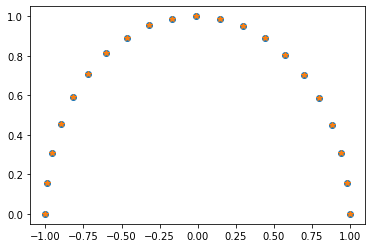

In [28]:
plt.plot(Phi_new[:,0],Phi_new[:,1],'o')
plt.plot(Phi[:,0],Phi[:,1],'*')

In [41]:
s=[]
length=len(Phi)
s.append(0)#s_0=0
for i in range(length-1):
#     s.append(s[i]+np.exp(0.5*V(Phi[i+1,:])+0.5*V(Phi[i,:]))*LA.norm(Phi[i+1,:]-Phi[i,:]))
    s.append(s[i]+LA.norm(Phi[i+1,:]-Phi[i,:]))
alpha=np.array(s)/s[-1]

In [30]:
zfinal=list(map(V,Phi))

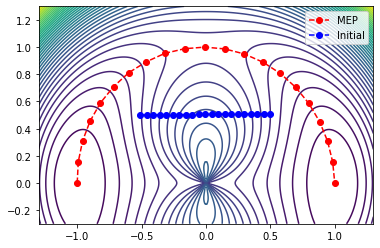

In [31]:
plt.plot(Phi[:,0],Phi[:,1],'--ro')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--o')
plt.legend(['MEP','Initial'])

In [48]:
maxid=zfinal.index(max(zfinal))

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


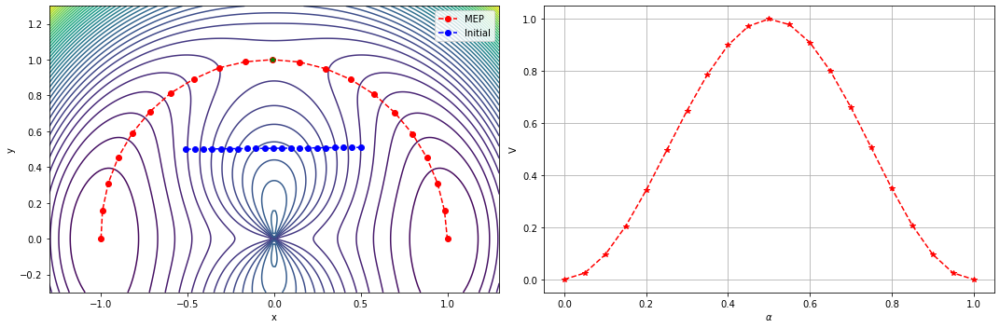

In [55]:
plt.figure(figsize=[15,5])
plt.subplot(1, 2, 1)

plt.plot(Phi[:,0],Phi[:,1],'--ro')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--o')
plt.plot(Phi[maxid,0],Phi[maxid,1],'g*')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(['MEP','Initial'])

plt.subplot(1, 2, 2)
plt.plot(alpha,zfinal,'--r*')
plt.grid(True)
plt.xlabel(r'$\alpha$')
plt.ylabel('V')
# plt.plot(Phi[sec,0],Phi[sec,1],'g*')

plt.tight_layout()
plt.savefig('Illustration_string.eps',format='eps')

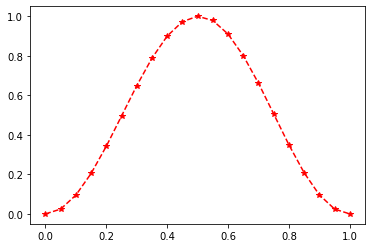

In [42]:
plt.plot(alpha,zfinal,'--r*')

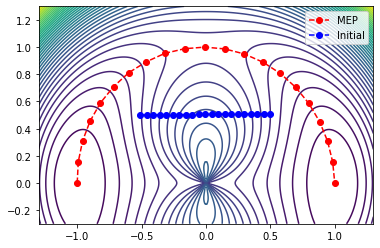

In [164]:
plt.plot(Phi[:,0],Phi[:,1],'--ro')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--o')
plt.legend(['MEP','Initial'])

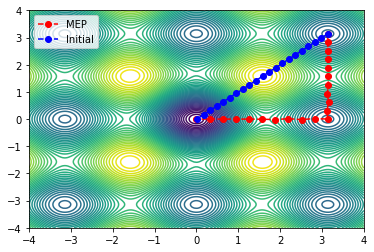

In [63]:
plt.plot(Phi[:,0],Phi[:,1],'--ro')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--o')
plt.legend(['MEP','Initial'])

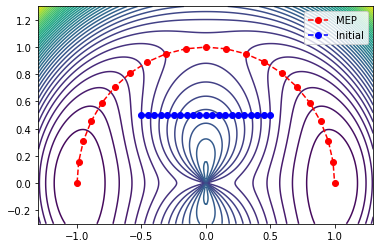

In [21]:
plt.plot(Phi[:,0],Phi[:,1],'--ro')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--o')
plt.legend(['MEP','Initial'])

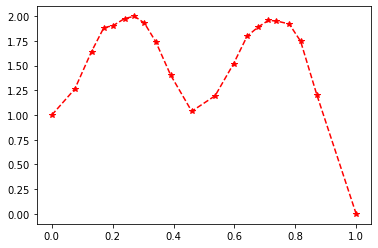

In [62]:
plt.plot(alpha,zfinal,'--r*')

## Climbing string

In [83]:
maxid=0
length=len(zfinal)
for i in range(length):
    if zfinal[i]>zfinal[maxid]:
        maxid=i
        
sec=0
for i in range(maxid+5,length):
    if zfinal[i]>zfinal[sec]:
        sec=i

In [84]:
LA.norm(gradient_V(Phi[maxid])),LA.norm(gradient_V(Phi[sec]))

(0.0062009426721489624, 0.25868414048921284)

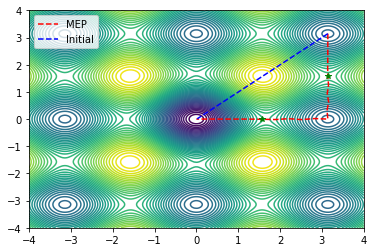

In [81]:
plt.plot(Phi[:,0],Phi[:,1],'--r')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--')
plt.legend(['MEP','Initial'])
plt.plot(Phi[maxid,0],Phi[maxid,1],'g*')
plt.plot(Phi[sec,0],Phi[sec,1],'g*')

In [86]:
def tao(Phi,z):
    '''
    Phi: discretized string
    z:function value of string
    '''
    s=zfinal.index(max(zfinal))#the index of saddle point in the string 
    if z[s+1]>z[s]>z[s-1]:
        e=Phi[s+1]-Phi[s]
    elif z[s+1]<z[s]<z[s-1]:
        e=Phi[s]-Phi[s-1]
    else:
        e=Phi[s+1]-Phi[s-1]
    return e/LA.norm(e)

In [91]:
e=Phi[maxid+1]-Phi[maxid-1]
e/LA.norm(e)

array([ 0.03187226, -0.99949195])

In [92]:
tao_h=tao(Phi,zfinal)

In [79]:
np.matmul(tao(Phi,zfinal),phi_s)

5.174352291533589e-15

In [93]:
def sd_dynamic(phi,tao=tao_h):
    gradient=gradient_V(phi)
    return gradient-2*np.matmul(tao,gradient)*tao

In [96]:
rf_sd=Phi[sec]
ac_sd=0*rf_sd

In [101]:
MAXITER=200#max iteration steps
steps=1
# start=time()
while 1:
    rg=rungeKutta(rf_sd,dt,sd_dynamic)
#         rg=euler(Phi[i,:],dt,gradient_V(Phi[i,:]))
    error=LA.norm(rg)/dt
    ac_sd=rf_sd+rg
    steps+=1
    print(error)
    print('\n')
    if error<TOL:#if d<TOL stop iteration
        print('converges after %d steps'%steps)
        break
    if steps>MAXITER:
        print('does not converge until %d iteration'%MAXITER)
        break
    rf_sd=ac_sd

0.2585125059095761


0.258855478391888


0.2591989226044752


0.2595428392213428


0.25988722891745103


0.26023209236871786


0.26057743025201746


0.26092324324518423


0.261269532027012


0.26161629727725405


0.26196353967662805


0.262311259906813


0.2626594586504511


0.2630081365911512


0.26335729441348743


0.2637069328030007


0.2640570524462004


0.2644076540305645


0.2647587382445417


0.26511030577755035


0.2654623573199826


0.26581489356320237


0.26616791519954924


0.26652142292233577


0.2668754174258531


0.2672298994053673


0.2675848695571237


0.2679403285783467


0.2682962771672406


0.2686527160229918


0.26900964584576803


0.26936706733671917


0.269724981197982


0.27008338813267546


0.2704422888449064


0.27080168403976834


0.2711615744233434


0.2715219607027024


0.27188284358590564


0.27224422378200586


0.27260610200104674


0.27296847895406573


0.2733313553530935


0.2736947319111565


0.27405860934227694


0.2744229883614739


0.2747878696847642

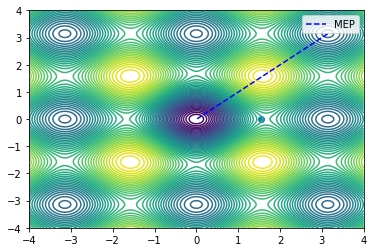

In [114]:
# plt.plot(Phi[:,0],Phi[:,1],'--r')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--')
plt.legend(['MEP','Initial'])
# plt.plot(Phi[maxid,0],Phi[maxid,1],'g*')
# plt.plot(Phi[sec,0],Phi[sec,1],'g*')
plt.scatter(ac_sd[0],ac_sd[1])

In [108]:
ac_sd[0]

1.5444860892892758

In [104]:
LA.norm(gradient_V(ac_sd)),LA.norm(gradient_V(Phi[sec]))

(0.33767019417368316, 0.25868414048921284)

In [90]:
phi_s

array([3.67181626e-09, 1.00061875e-02])

截取一段string，能量上升到粗糙的鞍点，运用climbing string


In [118]:
I_string=Phi[:maxid+1,:]

In [123]:
N=len(I_string)-1
TOL=max(pow(N,-4),pow(10,-10))
dt=0.05*min(0.2,1/N)

In [125]:
I_string[N],Phi[maxid]

(array([3.14137896, 1.56770923]), array([3.14137896, 1.56770923]))

In [ ]:
def sd_dynamic(phi,tao=tao_h):
    gradient=gradient_V(phi)
    return gradient-2*np.matmul(tao,gradient)*tao

In [138]:
his_error=[]

In [139]:
MAXITER=2500#max iteration steps
steps=1
Phi=I_string
iter_error=[0]*(N+1)
start=time()
while 1:
    print('Iteration %d'%steps)
    Phi_new=np.zeros_like(Phi)#reset Phi_new
    #update string except the saddle point
    for i in range(N):
        rg=rungeKutta(Phi[i,:],dt,gradient_V)
#         rg=euler(Phi[i,:],dt,gradient_V(Phi[i,:]))
        iter_error[i]=LA.norm(rg)/dt
        Phi_new[i,:]=Phi[i,:]+rg#iteration scheme
        
    #saddle point update
    difference=Phi[-1]-Phi[-2]
    tao=difference/LA.norm(difference)
    rg=rungeKutta(Phi[-1],dt,lambda x:sd_dynamic(x,tao))
    iter_error[N]=LA.norm(rg)/dt
    Phi_new[N,:]=Phi[N,:]+rg
    
    #reparameterization
    Phi=Repara(Phi_new,N)#update Phi
#     iter_error=list(map(gradient_V,Phi))
    steps+=1
    ee=max(iter_error)
    his_error.append(ee)
    print(ee)
    print('\n')
    if ee<TOL:#if d<TOL stop iteration
        print('converges after %d steps'%steps)
        break
    if steps>MAXITER:
        print('does not converge until %d iteration'%MAXITER)
        break
time_cost=time()-start

Iteration 1
0.9546905748419536


Iteration 2
0.9546752903374123


Iteration 3
0.9546603944541201


Iteration 4
0.9546458029634487


Iteration 5
0.9546315096993903


Iteration 6
0.9546175086207448


Iteration 7
0.9546037938003151


Iteration 8
0.9545903594234955


Iteration 9
0.95457719978675


Iteration 10
0.9545643092959967


Iteration 11
0.9545516824649156


Iteration 12
0.9545393139132047


Iteration 13
0.9545271983647944


Iteration 14
0.9545153306460352


Iteration 15
0.9545037056838805


Iteration 16
0.954492318504057


Iteration 17
0.9544811642292532


Iteration 18
0.9544702380773241


Iteration 19
0.9544595353595151


Iteration 20
0.9544490514787212


Iteration 21
0.9544387819277788


Iteration 22
0.9544287222877973


Iteration 23
0.954418868226529


Iteration 24
0.9544092154967841


Iteration 25
0.9543997599348925


Iteration 26
0.9543904974592041


Iteration 27
0.9543814240686417


Iteration 28
0.9543725358412858


Iteration 29
0.9543638289330134


Iteration 30
0.954355299576

0.9539447139795935


Iteration 270
0.9539446506713953


Iteration 271
0.9539445886421207


Iteration 272
0.953944527865943


Iteration 273
0.9539444683175522


Iteration 274
0.9539444099721514


Iteration 275
0.9539443528054445


Iteration 276
0.9539442967936241


Iteration 277
0.9539442419133632


Iteration 278
0.9539441881418066


Iteration 279
0.9539441354565602


Iteration 280
0.9539440838356816


Iteration 281
0.9539440332576704


Iteration 282
0.9539439837014605


Iteration 283
0.953943935146412


Iteration 284
0.9539438875723


Iteration 285
0.9539438409593094


Iteration 286
0.9539437952880243


Iteration 287
0.9539437505394198


Iteration 288
0.9539437066948567


Iteration 289
0.9539436637360716


Iteration 290
0.9539436216451692


Iteration 291
0.9539435804046155


Iteration 292
0.9539435399972315


Iteration 293
0.9539435004061841


Iteration 294
0.9539434616149797


Iteration 295
0.9539434236074602


Iteration 296
0.9539433863677914


Iteration 297
0.953943349880458


Itera


Iteration 631
0.9539415821608421


Iteration 632
0.9539415821216739


Iteration 633
0.9539415820832966


Iteration 634
0.9539415820456953


Iteration 635
0.9539415820088536


Iteration 636
0.9539415819727554


Iteration 637
0.9539415819373873


Iteration 638
0.9539415819027333


Iteration 639
0.953941581868779


Iteration 640
0.9539415818355111


Iteration 641
0.9539415818029158


Iteration 642
0.9539415817709782


Iteration 643
0.9539415817396862


Iteration 644
0.9539415817090258


Iteration 645
0.9539415816789855


Iteration 646
0.9539415816495511


Iteration 647
0.9539415816207123


Iteration 648
0.9539415815924558


Iteration 649
0.9539415815647697


Iteration 650
0.953941581537643


Iteration 651
0.9539415815110648


Iteration 652
0.9539415814850236


Iteration 653
0.9539415814595076


Iteration 654
0.9539415814345081


Iteration 655
0.9539415814100123


Iteration 656
0.9539415813860126


Iteration 657
0.9539415813624972


Iteration 658
0.9539415813394571


Iteration 659
0.95394

0.9539415802271033


Iteration 923
0.9539415802270003


Iteration 924
0.9539415802268991


Iteration 925
0.9539415802267999


Iteration 926
0.9539415802267027


Iteration 927
0.9539415802266077


Iteration 928
0.9539415802265142


Iteration 929
0.9539415802264228


Iteration 930
0.9539415802263336


Iteration 931
0.953941580226246


Iteration 932
0.9539415802261605


Iteration 933
0.9539415802260759


Iteration 934
0.9539415802259936


Iteration 935
0.9539415802259122


Iteration 936
0.9539415802258339


Iteration 937
0.9539415802257558


Iteration 938
0.9539415802256805


Iteration 939
0.953941580225605


Iteration 940
0.9539415802255329


Iteration 941
0.9539415802254614


Iteration 942
0.9539415802253917


Iteration 943
0.9539415802253223


Iteration 944
0.953941580225255


Iteration 945
0.9539415802251896


Iteration 946
0.9539415802251247


Iteration 947
0.9539415802250613


Iteration 948
0.953941580225


Iteration 949
0.9539415802249392


Iteration 950
0.9539415802248796


Iterat

0.9539415802220091


Iteration 1211
0.9539415802220077


Iteration 1212
0.9539415802220081


Iteration 1213
0.9539415802220081


Iteration 1214
0.9539415802220077


Iteration 1215
0.9539415802220073


Iteration 1216
0.9539415802220073


Iteration 1217
0.9539415802220069


Iteration 1218
0.9539415802220061


Iteration 1219
0.9539415802220057


Iteration 1220
0.953941580222006


Iteration 1221
0.9539415802220057


Iteration 1222
0.9539415802220054


Iteration 1223
0.9539415802220057


Iteration 1224
0.9539415802220049


Iteration 1225
0.9539415802220054


Iteration 1226
0.9539415802220046


Iteration 1227
0.9539415802220046


Iteration 1228
0.9539415802220041


Iteration 1229
0.9539415802220041


Iteration 1230
0.9539415802220041


Iteration 1231
0.9539415802220036


Iteration 1232
0.9539415802220033


Iteration 1233
0.9539415802220033


Iteration 1234
0.9539415802220033


Iteration 1235
0.9539415802220033


Iteration 1236
0.9539415802220026


Iteration 1237
0.9539415802220022


Iteratio

0.9539415802219958


Iteration 1481
0.9539415802219962


Iteration 1482
0.9539415802219958


Iteration 1483
0.9539415802219962


Iteration 1484
0.9539415802219958


Iteration 1485
0.9539415802219962


Iteration 1486
0.9539415802219958


Iteration 1487
0.9539415802219962


Iteration 1488
0.9539415802219958


Iteration 1489
0.9539415802219962


Iteration 1490
0.9539415802219958


Iteration 1491
0.9539415802219962


Iteration 1492
0.9539415802219958


Iteration 1493
0.9539415802219962


Iteration 1494
0.9539415802219958


Iteration 1495
0.9539415802219962


Iteration 1496
0.9539415802219958


Iteration 1497
0.9539415802219962


Iteration 1498
0.9539415802219958


Iteration 1499
0.9539415802219962


Iteration 1500
0.9539415802219958


Iteration 1501
0.9539415802219962


Iteration 1502
0.9539415802219958


Iteration 1503
0.9539415802219962


Iteration 1504
0.9539415802219958


Iteration 1505
0.9539415802219962


Iteration 1506
0.9539415802219958


Iteration 1507
0.9539415802219962


Iterati

0.9539415802219958


Iteration 1767
0.9539415802219962


Iteration 1768
0.9539415802219958


Iteration 1769
0.9539415802219962


Iteration 1770
0.9539415802219958


Iteration 1771
0.9539415802219962


Iteration 1772
0.9539415802219958


Iteration 1773
0.9539415802219962


Iteration 1774
0.9539415802219958


Iteration 1775
0.9539415802219962


Iteration 1776
0.9539415802219958


Iteration 1777
0.9539415802219962


Iteration 1778
0.9539415802219958


Iteration 1779
0.9539415802219962


Iteration 1780
0.9539415802219958


Iteration 1781
0.9539415802219962


Iteration 1782
0.9539415802219958


Iteration 1783
0.9539415802219962


Iteration 1784
0.9539415802219958


Iteration 1785
0.9539415802219962


Iteration 1786
0.9539415802219958


Iteration 1787
0.9539415802219962


Iteration 1788
0.9539415802219958


Iteration 1789
0.9539415802219962


Iteration 1790
0.9539415802219958


Iteration 1791
0.9539415802219962


Iteration 1792
0.9539415802219958


Iteration 1793
0.9539415802219962


Iterati

0.9539415802219962


Iteration 2004
0.9539415802219958


Iteration 2005
0.9539415802219962


Iteration 2006
0.9539415802219958


Iteration 2007
0.9539415802219962


Iteration 2008
0.9539415802219958


Iteration 2009
0.9539415802219962


Iteration 2010
0.9539415802219958


Iteration 2011
0.9539415802219962


Iteration 2012
0.9539415802219958


Iteration 2013
0.9539415802219962


Iteration 2014
0.9539415802219958


Iteration 2015
0.9539415802219962


Iteration 2016
0.9539415802219958


Iteration 2017
0.9539415802219962


Iteration 2018
0.9539415802219958


Iteration 2019
0.9539415802219962


Iteration 2020
0.9539415802219958


Iteration 2021
0.9539415802219962


Iteration 2022
0.9539415802219958


Iteration 2023
0.9539415802219962


Iteration 2024
0.9539415802219958


Iteration 2025
0.9539415802219962


Iteration 2026
0.9539415802219958


Iteration 2027
0.9539415802219962


Iteration 2028
0.9539415802219958


Iteration 2029
0.9539415802219962


Iteration 2030
0.9539415802219958


Iterati

0.9539415802219962


Iteration 2274
0.9539415802219958


Iteration 2275
0.9539415802219962


Iteration 2276
0.9539415802219958


Iteration 2277
0.9539415802219962


Iteration 2278
0.9539415802219958


Iteration 2279
0.9539415802219962


Iteration 2280
0.9539415802219958


Iteration 2281
0.9539415802219962


Iteration 2282
0.9539415802219958


Iteration 2283
0.9539415802219962


Iteration 2284
0.9539415802219958


Iteration 2285
0.9539415802219962


Iteration 2286
0.9539415802219958


Iteration 2287
0.9539415802219962


Iteration 2288
0.9539415802219958


Iteration 2289
0.9539415802219962


Iteration 2290
0.9539415802219958


Iteration 2291
0.9539415802219962


Iteration 2292
0.9539415802219958


Iteration 2293
0.9539415802219962


Iteration 2294
0.9539415802219958


Iteration 2295
0.9539415802219962


Iteration 2296
0.9539415802219958


Iteration 2297
0.9539415802219962


Iteration 2298
0.9539415802219958


Iteration 2299
0.9539415802219962


Iteration 2300
0.9539415802219958


Iterati

In [144]:
s=[]
length=len(Phi)
s.append(0)#s_0=0
for i in range(length-1):
    s.append(s[i]+LA.norm(Phi[i+1,:]-Phi[i,:]))
alpha=np.array(s)/s[-1]

In [141]:
zfinal=list(map(V,Phi))

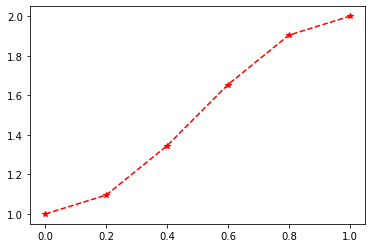

In [145]:
plt.plot(alpha,zfinal,'--r*')

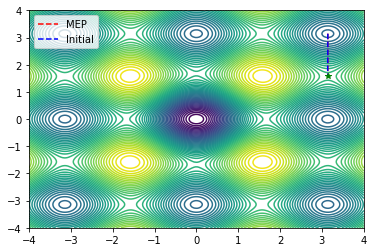

In [153]:
plt.plot(Phi[:,0],Phi[:,1],'--r')
plt.contour(X,Y,Z,50)
plt.plot(I_string[:,0],I_string[:,1],'b--')
plt.legend(['MEP','Initial'])
plt.plot(Phi[maxid,0],Phi[maxid,1],'g*')
# plt.plot(Phi[sec,0],Phi[sec,1],'g*')
# plt.scatter(ac_sd[0],ac_sd[1])

In [149]:
LA.norm(gradient_V(Phi[-1]))

2.433873434755344e-14

In [151]:
LA.norm(gradient_V(I_string[-1]))

0.0062009426721489624

In [155]:
I_string[N],Phi[maxid]

(array([3.14137896, 1.56770923]), array([3.14157887, 1.57080322]))